# Understanding the Streaming Ecosystem

## 1. Introduction
This notebook explores the streaming ecosystem to identify key trends, content gaps, and factors contributing to the success of TV shows and movies.


In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
import plotly.offline as py
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go
py.init_notebook_mode(connected = True)
import plotly.offline  
from IPython.display import Markdown
def bold(string):
    display(Markdown(string))

##  2. Load and Inspect Data

In [3]:
reelgood = pd.read_csv('Reel Good Data (Title+Service+Genre+Tag List).csv')

/var/folders/29/lh61825n1_v9yg4fhnvmrhmc0000gn/T/ipykernel_34869/1651220786.py:1: DtypeWarning:

Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.



In [4]:
reelgood.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 287834 entries, 0 to 287833
Data columns (total 19 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             287834 non-null  int64  
 1   Title                  287834 non-null  object 
 2   URL                    287834 non-null  object 
 3   Type                   287834 non-null  object 
 4   Service                287834 non-null  object 
 5   Genre                  287834 non-null  object 
 6   Tag                    287834 non-null  object 
 7   IMDB                   283312 non-null  float64
 8   ReelGood               286904 non-null  float64
 9   AgeRating              166197 non-null  object 
 10  Rated                  97564 non-null   object 
 11  Released Year          287834 non-null  int64  
 12  Duration Year          23071 non-null   object 
 13  Seasons                23047 non-null   float64
 14  What it's about        148046 non-nu

In [109]:
reelgood.head()

,Unnamed: 0,Title,URL,Type,Service,Genre,Tag,IMDB,ReelGood,AgeRating,Rated,Released Year,Duration Year,Seasons,What it's about,Where to Watch,Rent or Buy Available,Exclusive Service,Has Tag
0,0,Breaking Bad,/show/breaking-bad-2008,tv,netflix,Crime,"['Drug', 'Doctor', 'Teacher', 'Gangster', 'Hig...",9.5,100.0,18+,TV-MA,2008,2008-2020,5.0,"When Walter White, a New Mexico chemistry teac...",62 episodes (100%) are available to stream on ...,1,0,1
1,1,Breaking Bad,/show/breaking-bad-2008,tv,netflix,Drama,"['Drug', 'Doctor', 'Teacher', 'Gangster', 'Hig...",9.5,100.0,18+,TV-MA,2008,2008-2020,5.0,"When Walter White, a New Mexico chemistry teac...",62 episodes (100%) are available to stream on ...,1,0,1
2,2,Game of Thrones,/show/game-of-thrones-2011,tv,hbo_max,Drama,"['War', 'Royalty', 'Political', 'Based on Book...",9.3,98.0,18+,TV-MA,2011,2011-2020,8.0,Seven noble families fight for control of the ...,74 episodes (100%) are available to stream on ...,1,0,1
3,3,Game of Thrones,/show/game-of-thrones-2011,tv,hbo_max,Action & Adventure,"['War', 'Royalty', 'Political', 'Based on Book...",9.3,98.0,18+,TV-MA,2011,2011-2020,8.0,Seven noble families fight for control of the ...,74 episodes (100%) are available to stream on ...,1,0,1
4,4,Game of Thrones,/show/game-of-thrones-2011,tv,hbo_max,Fantasy,"['War', 'Royalty', 'Political', 'Based on Book...",9.3,98.0,18+,TV-MA,2011,2011-2020,8.0,Seven noble families fight for control of the ...,74 episodes (100%) are available to stream on ...,1,0,1


In [110]:
reelgood = reelgood.drop(['Unnamed: 0'], axis = 1) 
reelgood.head(5)

,Title,URL,Type,Service,Genre,Tag,IMDB,ReelGood,AgeRating,Rated,Released Year,Duration Year,Seasons,What it's about,Where to Watch,Rent or Buy Available,Exclusive Service,Has Tag
0,Breaking Bad,/show/breaking-bad-2008,tv,netflix,Crime,"['Drug', 'Doctor', 'Teacher', 'Gangster', 'Hig...",9.5,100.0,18+,TV-MA,2008,2008-2020,5.0,"When Walter White, a New Mexico chemistry teac...",62 episodes (100%) are available to stream on ...,1,0,1
1,Breaking Bad,/show/breaking-bad-2008,tv,netflix,Drama,"['Drug', 'Doctor', 'Teacher', 'Gangster', 'Hig...",9.5,100.0,18+,TV-MA,2008,2008-2020,5.0,"When Walter White, a New Mexico chemistry teac...",62 episodes (100%) are available to stream on ...,1,0,1
2,Game of Thrones,/show/game-of-thrones-2011,tv,hbo_max,Drama,"['War', 'Royalty', 'Political', 'Based on Book...",9.3,98.0,18+,TV-MA,2011,2011-2020,8.0,Seven noble families fight for control of the ...,74 episodes (100%) are available to stream on ...,1,0,1
3,Game of Thrones,/show/game-of-thrones-2011,tv,hbo_max,Action & Adventure,"['War', 'Royalty', 'Political', 'Based on Book...",9.3,98.0,18+,TV-MA,2011,2011-2020,8.0,Seven noble families fight for control of the ...,74 episodes (100%) are available to stream on ...,1,0,1
4,Game of Thrones,/show/game-of-thrones-2011,tv,hbo_max,Fantasy,"['War', 'Royalty', 'Political', 'Based on Book...",9.3,98.0,18+,TV-MA,2011,2011-2020,8.0,Seven noble families fight for control of the ...,74 episodes (100%) are available to stream on ...,1,0,1


In [111]:
elelelelreelgoodel['Type'].value_counts()

movies    237158
tv         50676
Name: Type, dtype: int64

In [112]:
reelgood.shape

(287834, 18)

## 3. Data Cleaning

In [113]:
print(reelgood.info(), "\n")
print(reelgood.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 287834 entries, 0 to 287833
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Title                  287834 non-null  object 
 1   URL                    287834 non-null  object 
 2   Type                   287834 non-null  object 
 3   Service                287834 non-null  object 
 4   Genre                  287834 non-null  object 
 5   Tag                    287834 non-null  object 
 6   IMDB                   283312 non-null  float64
 7   ReelGood               286904 non-null  float64
 8   AgeRating              166197 non-null  object 
 9   Rated                  97564 non-null   object 
 10  Released Year          287834 non-null  int64  
 11  Duration Year          23071 non-null   object 
 12  Seasons                23047 non-null   float64
 13  What it's about        148046 non-null  object 
 14  Where to Watch         134161 non-nu

In [114]:
reelgood.count()

Title                    287834
URL                      287834
Type                     287834
Service                  287834
Genre                    287834
Tag                      287834
IMDB                     283312
ReelGood                 286904
AgeRating                166197
Rated                     97564
Released Year            287834
Duration Year             23071
Seasons                   23047
What it's about          148046
Where to Watch           134161
Rent or Buy Available    287834
Exclusive Service        287834
Has Tag                  287834
dtype: int64

In [115]:
reelgood.describe()

,IMDB,ReelGood,Released Year,Seasons,Rent or Buy Available,Exclusive Service,Has Tag
count,283312.000000,286904.000000,287834.000000,23047.000000,287834.000000,287834.000000,287834.000000
mean,6.118687,48.807793,2002.764830,4.335011,0.857300,0.204819,0.513643
std,1.339057,15.625157,19.746377,5.607982,0.349768,0.403570,0.499815
min,1.000000,10.000000,1900.000000,1.000000,0.000000,0.000000,0.000000
25%,5.300000,36.000000,1999.000000,1.000000,1.000000,0.000000,0.000000
50%,6.300000,46.000000,2011.000000,3.000000,1.000000,0.000000,1.000000
75%,7.100000,60.000000,2015.000000,5.000000,1.000000,0.000000,1.000000
max,10.000000,100.000000,2020.000000,86.000000,1.000000,1.000000,1.000000


In [116]:
reelgood['Type'].unique()

array(['tv', 'movies'], dtype=object)

Perform an analysis of null(missing) values in a dataset 

In [117]:
null_counts = reelgood.isnull().sum()
total_rows = len(reelgood)
null_percentage = (null_counts / total_rows) * 100
null_percentage_df = pd.DataFrame({'Column Name': null_percentage.index, 'Null Percentage': null_percentage.values})
null_percentage_df = null_percentage_df.sort_values(by='Null Percentage', ascending=False)
null_percentage_df.reset_index(drop=True, inplace=True)
print(null_percentage_df)

              Column Name  Null Percentage
0                 Seasons        91.992954
1           Duration Year        91.984616
2                   Rated        66.104074
3          Where to Watch        53.389454
4         What it's about        48.565493
5               AgeRating        42.259427
6                    IMDB         1.571044
7                ReelGood         0.323103
8       Exclusive Service         0.000000
9   Rent or Buy Available         0.000000
10                  Title         0.000000
11          Released Year         0.000000
12                    URL         0.000000
13                    Tag         0.000000
14                  Genre         0.000000
15                Service         0.000000
16                   Type         0.000000
17                Has Tag         0.000000


In [118]:
reelgood.columns

Index(['Title', 'URL', 'Type', 'Service', 'Genre', 'Tag', 'IMDB', 'ReelGood',
       'AgeRating', 'Rated', 'Released Year', 'Duration Year', 'Seasons',
       'What it's about', 'Where to Watch', 'Rent or Buy Available',
       'Exclusive Service', 'Has Tag'],
      dtype='object')

The high percentage of missing data in the "Seasons" and "Duration Year" columns may impact certain analyses or recommendations that rely on this information. Depending on the speicific golas of the analysis, it may be necessary to address these missing values through data imputation or to focus on aspects of the dataset that are more complete. 

Missing values in selected columns of the Reelgood dataset are imputed with the placeholder value "Unknown." The columns chosen for imputation include 'Seasons,' 'Duration Year,' 'Rated,' 'Where to Watch,' 'What it's about,' 'AgeRating,' 'IMDB,' and 'ReelGood' 

In [119]:
columns_to_impute = ['Seasons', 'Duration Year', 'Rated', "What it's about", 'Where to Watch', 'AgeRating', 'IMDB', 'ReelGood']

for column in columns_to_impute:
    reelgood[column].fillna("Unknown", inplace=True)

In [120]:
reelgood

,Title,URL,Type,Service,Genre,Tag,IMDB,ReelGood,AgeRating,Rated,Released Year,Duration Year,Seasons,What it's about,Where to Watch,Rent or Buy Available,Exclusive Service,Has Tag
0,Breaking Bad,/show/breaking-bad-2008,tv,netflix,Crime,"['Drug', 'Doctor', 'Teacher', 'Gangster', 'Hig...",9.5,100.0,18+,TV-MA,2008,2008-2020,5.0,"When Walter White, a New Mexico chemistry teac...",62 episodes (100%) are available to stream on ...,1,0,1
1,Breaking Bad,/show/breaking-bad-2008,tv,netflix,Drama,"['Drug', 'Doctor', 'Teacher', 'Gangster', 'Hig...",9.5,100.0,18+,TV-MA,2008,2008-2020,5.0,"When Walter White, a New Mexico chemistry teac...",62 episodes (100%) are available to stream on ...,1,0,1
2,Game of Thrones,/show/game-of-thrones-2011,tv,hbo_max,Drama,"['War', 'Royalty', 'Political', 'Based on Book...",9.3,98.0,18+,TV-MA,2011,2011-2020,8.0,Seven noble families fight for control of the ...,74 episodes (100%) are available to stream on ...,1,0,1
3,Game of Thrones,/show/game-of-thrones-2011,tv,hbo_max,Action & Adventure,"['War', 'Royalty', 'Political', 'Based on Book...",9.3,98.0,18+,TV-MA,2011,2011-2020,8.0,Seven noble families fight for control of the ...,74 episodes (100%) are available to stream on ...,1,0,1
4,Game of Thrones,/show/game-of-thrones-2011,tv,hbo_max,Fantasy,"['War', 'Royalty', 'Political', 'Based on Book...",9.3,98.0,18+,TV-MA,2011,2011-2020,8.0,Seven noble families fight for control of the ...,74 episodes (100%) are available to stream on ...,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287829,Antes de Morir,/movie/antes-de-morir-2000,movies,plutotv,Drama,"[nan, nan, nan, nan]",Unknown,12.0,13+,Unknown,2000,Unknown,Unknown,Unknown,Unknown,0,0,0
287830,Kurdish Factor: The Untold Story Of The Gulf Wars,/movie/kurdish-factor-the-untold-story-of-the-...,movies,amazon_prime,Documentary,[nan],Unknown,Unknown,Unknown,Unknown,2018,Unknown,Unknown,Unknown,Unknown,1,0,0
287831,Latex - Fetish or Fashion?,/movie/latex-fetish-or-fashion-2017-1,movies,hoopla,Documentary,[nan],Unknown,12.0,Unknown,Unknown,2017,Unknown,Unknown,Unknown,Unknown,0,1,0
287832,Macbeth,/movie/macbeth-1997-1,movies,hoopla,Drama,[nan],Unknown,10.0,Unknown,Unknown,1997,Unknown,Unknown,Unknown,Unknown,0,1,0


In [121]:
reelgood['Type']

0             tv
1             tv
2             tv
3             tv
4             tv
           ...  
287829    movies
287830    movies
287831    movies
287832    movies
287833    movies
Name: Type, Length: 287834, dtype: object

<h2>Segmentation into TV Shows and Movies </h2>

reelgood dataset is segmented into two idstinct subsets :TV shows and movies. The segmentation is baed on the 'type'column, which indicates whether a given entry is a "TV Show" or a "Movie"

In [6]:
tv_show= reelgood[reelgood['Type']=='tv']
movie = reelgood[reelgood['Type']=='movies']

In [7]:
display(movie.head(4), '_')
display(tv_show.head(4))

,Unnamed: 0,Title,URL,Type,Service,Genre,Tag,IMDB,ReelGood,AgeRating,Rated,Released Year,Duration Year,Seasons,What it's about,Where to Watch,Rent or Buy Available,Exclusive Service,Has Tag
50676,50676,The Shawshank Redemption,/movie/the-shawshank-redemption-1994,movies,fubo_tv,Crime,"['Escape', 'Prison', 'Feel-good', 'Political',...",9.3,100.0,18+,R,1994,NaN,NaN,Framed in the 1940s for the double murder of h...,Available to stream on a popular subscription ...,1,0,1
50677,50677,The Shawshank Redemption,/movie/the-shawshank-redemption-1994,movies,fubo_tv,Drama,"['Escape', 'Prison', 'Feel-good', 'Political',...",9.3,100.0,18+,R,1994,NaN,NaN,Framed in the 1940s for the double murder of h...,Available to stream on a popular subscription ...,1,0,1
50678,50678,Inception,/movie/inception-2010,movies,amazon_prime,Science-Fiction,"['Survival', 'Kidnapping', 'Genius', 'Car', 'S...",8.8,98.0,13+,PG-13,2010,NaN,NaN,"Cobb, a skilled thief who commits corporate es...",NaN,1,0,1
50679,50679,Inception,/movie/inception-2010,movies,amazon_prime,Action & Adventure,"['Survival', 'Kidnapping', 'Genius', 'Car', 'S...",8.8,98.0,13+,PG-13,2010,NaN,NaN,"Cobb, a skilled thief who commits corporate es...",NaN,1,0,1


'_'

,Unnamed: 0,Title,URL,Type,Service,Genre,Tag,IMDB,ReelGood,AgeRating,Rated,Released Year,Duration Year,Seasons,What it's about,Where to Watch,Rent or Buy Available,Exclusive Service,Has Tag
0,0,Breaking Bad,/show/breaking-bad-2008,tv,netflix,Crime,"['Drug', 'Doctor', 'Teacher', 'Gangster', 'Hig...",9.5,100.0,18+,TV-MA,2008,2008-2020,5.0,"When Walter White, a New Mexico chemistry teac...",62 episodes (100%) are available to stream on ...,1,0,1
1,1,Breaking Bad,/show/breaking-bad-2008,tv,netflix,Drama,"['Drug', 'Doctor', 'Teacher', 'Gangster', 'Hig...",9.5,100.0,18+,TV-MA,2008,2008-2020,5.0,"When Walter White, a New Mexico chemistry teac...",62 episodes (100%) are available to stream on ...,1,0,1
2,2,Game of Thrones,/show/game-of-thrones-2011,tv,hbo_max,Drama,"['War', 'Royalty', 'Political', 'Based on Book...",9.3,98.0,18+,TV-MA,2011,2011-2020,8.0,Seven noble families fight for control of the ...,74 episodes (100%) are available to stream on ...,1,0,1
3,3,Game of Thrones,/show/game-of-thrones-2011,tv,hbo_max,Action & Adventure,"['War', 'Royalty', 'Political', 'Based on Book...",9.3,98.0,18+,TV-MA,2011,2011-2020,8.0,Seven noble families fight for control of the ...,74 episodes (100%) are available to stream on ...,1,0,1


<h2> OLDEST MOVIES </h2>

In [124]:
movies_df = reelgood[reelgood['Type'] == 'movies']
oldest_movie = movies_df[movies_df['Released Year'] == movies_df['Released Year'].min()]
oldest_movie

,Title,URL,Type,Service,Genre,Tag,IMDB,ReelGood,AgeRating,Rated,Released Year,Duration Year,Seasons,What it's about,Where to Watch,Rent or Buy Available,Exclusive Service,Has Tag
188712,Going to Bed Under Difficulties,/movie/going-to-bed-under-difficulties-1900,movies,fandor,Fantasy,"['Mature', 'Mature']",6.7,41.0,Unknown,Unknown,1900,Unknown,Unknown,A man takes off his clothes in preparation for...,Available to stream on a subscription service ...,0,1,1
188713,Going to Bed Under Difficulties,/movie/going-to-bed-under-difficulties-1900,movies,fandor,Comedy,"['Mature', 'Mature']",6.7,42.0,Unknown,Unknown,1900,Unknown,Unknown,A man takes off his clothes in preparation for...,Available to stream on a subscription service ...,0,1,1
203884,Automated Hat-Maker and Sausage-Grinder,/movie/automated-hat-maker-and-sausage-grinder...,movies,fandor,Comedy,['Female Director'],5.6,38.0,Unknown,Unknown,1900,Unknown,Unknown,A machine churns out sausages on one side and ...,Available to stream on a subscription service ...,0,1,1
204581,At the Photographer's,/movie/at-the-photographers-1900,movies,fandor,Comedy,['Female Director'],5.3,39.0,Unknown,Unknown,1900,Unknown,Unknown,A client has trouble listening to the photogra...,Available to stream on a subscription service ...,0,1,1
205880,Avenue de l'opéra,/movie/avenue-de-lopera-1900,movies,fandor,Comedy,['Female Director'],5.6,38.0,Unknown,Unknown,1900,Unknown,Unknown,Alice Guy short in which a shot of a busy stre...,Available to stream on a subscription service ...,0,1,1
209315,Pierrette's Escapades,/movie/pierrettes-escapades-1900,movies,fandor,Romance,['Female Director'],5.5,37.0,Unknown,Unknown,1900,Unknown,Unknown,Columbine resists Pierrette's courting in favo...,Available to stream on a subscription service ...,0,1,1
211806,The Landlady,/movie/the-landlady-1900,movies,fandor,Comedy,"['Short', 'Female Director']",5.3,37.0,Unknown,Unknown,1900,Unknown,Unknown,A landlady is taunted by neighborhood kids,Available to stream on a subscription service ...,0,1,1
213460,Turn-of-the-Century Surgery,/movie/turn-of-the-century-surgery-1900,movies,fandor,Horror,['Female Director'],5.7,38.0,Unknown,Unknown,1900,Unknown,Unknown,George Mélies made a version of this a few yea...,Available to stream on a subscription service ...,0,1,1
213461,Turn-of-the-Century Surgery,/movie/turn-of-the-century-surgery-1900,movies,fandor,Science-Fiction,['Female Director'],5.7,38.0,Unknown,Unknown,1900,Unknown,Unknown,George Mélies made a version of this a few yea...,Available to stream on a subscription service ...,0,1,1
213462,Turn-of-the-Century Surgery,/movie/turn-of-the-century-surgery-1900,movies,fandor,Comedy,['Female Director'],5.7,38.0,Unknown,Unknown,1900,Unknown,Unknown,George Mélies made a version of this a few yea...,Available to stream on a subscription service ...,0,1,1


<h2> OLDEST TV SHOWS </h2>

In [156]:
movies_df = reelgood[reelgood['Type'] == 'tv']
oldest_movie = movies_df[movies_df['Released Year'] == movies_df['Released Year'].min()]
oldest_movie

,Title,URL,Type,Service,Genre,Tag,IMDB,ReelGood,AgeRating,Rated,Released Year,Duration Year,Seasons,What it's about,Where to Watch,Rent or Buy Available,Exclusive Service,Has Tag
19177,Our Gang,/show/our-gang-1922,tv,free,Family,"Unknown, Unknown, Unknown, Unknown, Unknown",8.0,56.0,Unknown,Unknown,1922,Unknown,Unknown,Unknown,Unknown,1,0,0
19178,Our Gang,/show/our-gang-1922,tv,free,Comedy,"Unknown, Unknown, Unknown, Unknown, Unknown",8.0,56.0,Unknown,Unknown,1922,Unknown,Unknown,Unknown,Unknown,1,0,0
19179,Our Gang,/show/our-gang-1922,tv,free,Children,"Unknown, Unknown, Unknown, Unknown, Unknown",8.0,56.0,Unknown,Unknown,1922,Unknown,Unknown,Unknown,Unknown,1,0,0
19180,Our Gang,/show/our-gang-1922,tv,tubi_tv,Family,"Unknown, Unknown, Unknown, Unknown, Unknown",8.0,56.0,Unknown,Unknown,1922,Unknown,Unknown,Unknown,Unknown,1,0,0
19181,Our Gang,/show/our-gang-1922,tv,tubi_tv,Comedy,"Unknown, Unknown, Unknown, Unknown, Unknown",8.0,56.0,Unknown,Unknown,1922,Unknown,Unknown,Unknown,Unknown,1,0,0
19182,Our Gang,/show/our-gang-1922,tv,tubi_tv,Children,"Unknown, Unknown, Unknown, Unknown, Unknown",8.0,56.0,Unknown,Unknown,1922,Unknown,Unknown,Unknown,Unknown,1,0,0
19183,Our Gang,/show/our-gang-1922,tv,plutotv,Family,"Unknown, Unknown, Unknown, Unknown, Unknown",8.0,56.0,Unknown,Unknown,1922,Unknown,Unknown,Unknown,Unknown,1,0,0
19184,Our Gang,/show/our-gang-1922,tv,plutotv,Comedy,"Unknown, Unknown, Unknown, Unknown, Unknown",8.0,56.0,Unknown,Unknown,1922,Unknown,Unknown,Unknown,Unknown,1,0,0
19185,Our Gang,/show/our-gang-1922,tv,plutotv,Children,"Unknown, Unknown, Unknown, Unknown, Unknown",8.0,56.0,Unknown,Unknown,1922,Unknown,Unknown,Unknown,Unknown,1,0,0
19186,Our Gang,/show/our-gang-1922,tv,best,Family,"Unknown, Unknown, Unknown, Unknown, Unknown",8.0,56.0,Unknown,Unknown,1922,Unknown,Unknown,Unknown,Unknown,1,0,0


In [125]:
len(reelgood['Genre'].unique())

28

## 4. Exploratory Data Analysis (EDA)

<h2> Top 5 Popular Genres</h2>

The top 5 most popular genres in the dataset, based on the number of titles available on ReelGood, are as follows:

Drama with  54598 titles.
Comedy with  35610 titles.
Action & Adventure with  28895 titles.
Documentary with 22730 titles.
Thriller with 18564 titles.
These genres have a significant presence in the Reelgood content library, with Drama being the most prominent, followed by Action & Adventure, Documentary and Thriller also have a substantial number of titles available on the platform, making them among the top genres on Reelgood.

In [137]:
genre_counts = reelgood['Genre'].str.split(', ').explode().value_counts()
top_5_genres = genre_counts.head(5)
print("Top 5 most popular genres:")
for genre, count in top_5_genres.items():
        print(f"{genre}: {count}")


Top 5 most popular genres:
Drama: 54598
Comedy: 35610
Action & Adventure: 28895
Documentary: 22730
Thriller: 18564


In [127]:
comedian_movies = reelgood[reelgood['Genre'] == 'Comedy']

In [128]:
comedian_movies.head(3)

,Title,URL,Type,Service,Genre,Tag,IMDB,ReelGood,AgeRating,Rated,Released Year,Duration Year,Seasons,What it's about,Where to Watch,Rent or Buy Available,Exclusive Service,Has Tag
9,Rick and Morty,/show/rick-and-morty-2013,tv,free,Comedy,"['Alien', 'Science', 'Space', 'Time Travel', '...",9.2,96.0,18+,TV-MA,2013,2013-2020,4.0,Rick is a mentally-unbalanced but scientifical...,5 episodes (12%) are available to watch free o...,1,0,1
13,Rick and Morty,/show/rick-and-morty-2013,tv,hbo_max,Comedy,"['Alien', 'Science', 'Space', 'Time Travel', '...",9.2,96.0,18+,TV-MA,2013,2013-2020,4.0,Rick is a mentally-unbalanced but scientifical...,5 episodes (12%) are available to watch free o...,1,0,1
17,Rick and Morty,/show/rick-and-morty-2013,tv,hulu_plus,Comedy,"['Alien', 'Science', 'Space', 'Time Travel', '...",9.2,96.0,18+,TV-MA,2013,2013-2020,4.0,Rick is a mentally-unbalanced but scientifical...,5 episodes (12%) are available to watch free o...,1,0,1


<h2> Top 20 Services</h2>

In [147]:
service_counts = reelgood['Service'].str.split(', ').explode().value_counts()
top_20_service = service_counts.head(20)

print("Top 20 most popular services:")

for service, count in top_20_service.items():
        print(f"{service}: {count}")


Top 20 most popular services:
free: 44021
Rent or Buy: 42572
tubi_tv: 31413
amazon_prime: 31390
hoopla: 15773
netflix: 11629
kanopy: 9440
plutotv: 8658
vudu_free: 7988
plex_free: 7305
hulu_plus: 5552
fubo_tv: 5405
hbo_max: 5029
epix: 4940
fandor: 3995
criterion_channel: 3489
philo: 3219
imdb_tv: 3166
hbo: 3042
starz: 3024


<h2>Define a list of known streaming platforms</h2>

In [150]:
service_counts = reelgood['Service'].str.split(', ').explode().value_counts()
streaming_platforms = ['netflix', 'amazon_prime', 'hulu', 'disney_plus', 'hbo_max']
streaming_platform_counts = service_counts.filter(items=streaming_platforms)
top_5_streaming_platforms = streaming_platform_counts.head(5)

print("Top 5 known streaming platforms:")
for platform, count in top_5_streaming_platforms.items():
    print(f"{platform}: {count}")


Top 5 known streaming platforms:
netflix: 11629
amazon_prime: 31390
disney_plus: 2569
hbo_max: 5029


<h2> Top 10 Popular Tags</h2>

In [142]:
reelgood['Tag'] = reelgood['Tag'].astype(str).str.replace(r'\[?nan\]?', 'Unknown', regex=True)

tag_counts = reelgood['Tag'].str.split(', ').explode().value_counts()
top_10_tag = tag_counts.head(10)
print("Top 10 most popular tags:")

for tag, count in top_10_tag.items():
    print(f"{tag}: {count}")

Top 10 most popular tags:
Unknown: 443511
'Supernatural': 45535
'Adaptation': 44797
'Doctor': 40908
'Female Director': 37573
'Religion': 29410
'Animal': 26807
'Psychology': 26659
'Sports': 25867
'Science': 22041


<h2> Rating and Content Type </h2>

<h2> Title </h2>

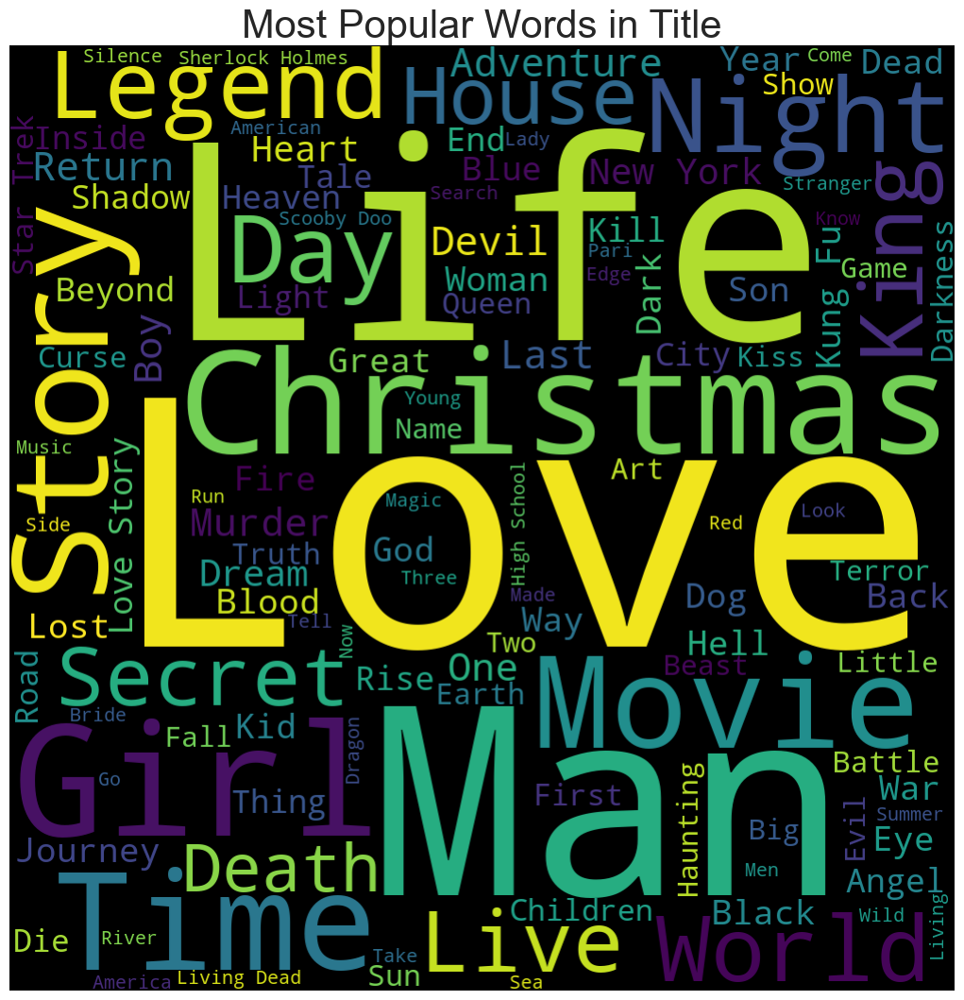

In [179]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
plt.rcParams['figure.figsize'] = (13, 13)
wordcloud = WordCloud(stopwords=STOPWORDS,background_color = 'black', width = 1000,  height = 1000, max_words = 121).generate(' '.join(reelgood['Title']))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('Most Popular Words in Title',fontsize = 30)
plt.show()

<h2> Tags</h2>

In [10]:
import nltk
from wordcloud import WordCloud

In [12]:
Tags =reelgood['Tag'].tolist()

Text(0.5, 1.0, 'Most Popular Words in Tag')

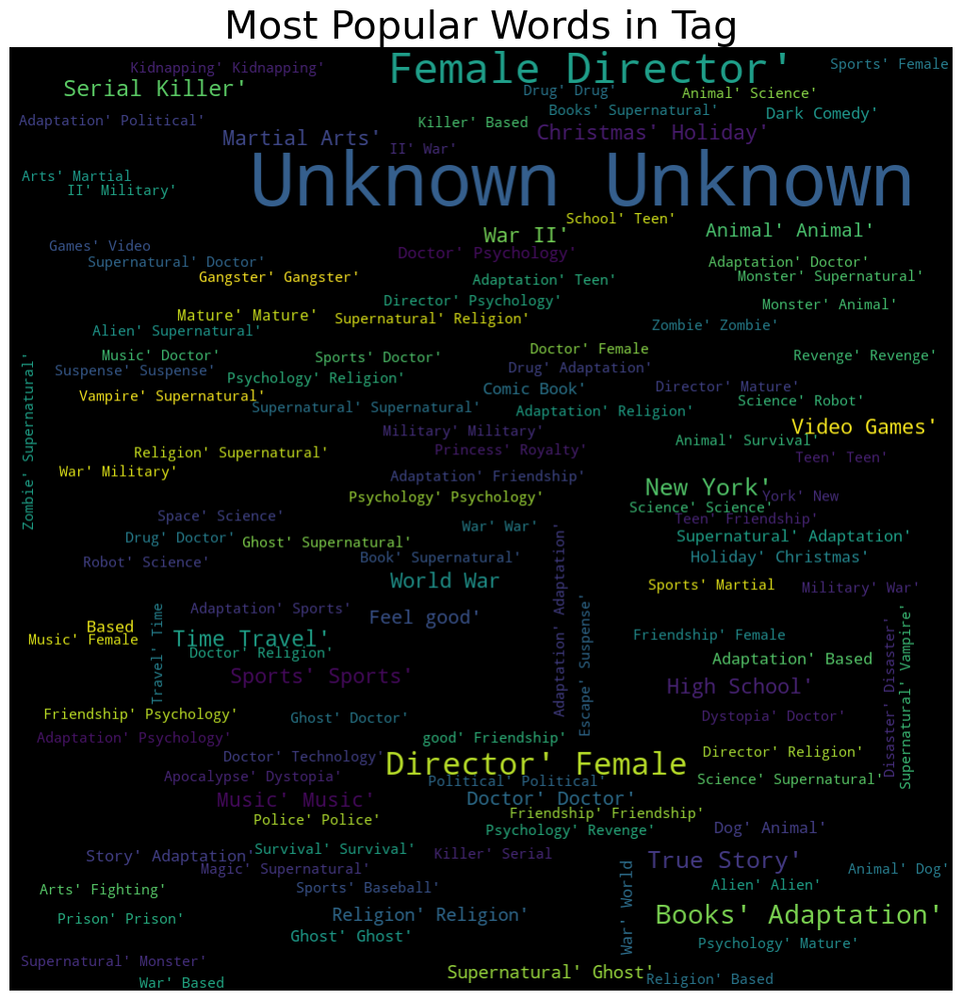

In [16]:
reelgood['Tag'] = reelgood['Tag'].astype(str).str.replace(r'\[?nan\]?', 'Unknown', regex=True)

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
plt.rcParams['figure.figsize'] = (13, 13)
wordcloud = WordCloud(stopwords=STOPWORDS,background_color = 'black', width = 1000,  height = 1000, max_words = 121).generate(' '.join(reelgood['Tag']))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('Most Popular Words in Tag',fontsize = 30)


<h2>Movies with the highest IMDb rating on each platform and genres</h2>

In [187]:
tv_show= reelgood[reelgood['Type']=='tv']
movie = reelgood[reelgood['Type']=='movies']

col = "Released Year"

vc1 = tv_show[col].value_counts().reset_index()
vc1 = vc1.rename(columns = {col : "count", "index" : col})
vc1['percent'] = vc1['count'].apply(lambda x : 100*x/sum(vc1['count']))
vc1 = vc1.sort_values(col)

vc2 = movie[col].value_counts().reset_index()
vc2 = vc2.rename(columns = {col : "count", "index" : col})
vc2['percent'] = vc2['count'].apply(lambda x : 100*x/sum(vc2['count']))
vc2 = vc2.sort_values(col)

trace1 = go.Scatter(
                    x=vc1[col], 
                    y=vc1["count"], 
                    name="TV Shows", 
                    marker=dict(color = 'rgb(249, 6, 6)',
                             line=dict(color='rgb(0,0,0)',width=1.5)))

trace2 = go.Scatter(
                    x=vc2[col], 
                    y=vc2["count"], 
                    name="Movies", 
                    marker= dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(
    hovermode='closest',
    title='Content added over the years',
    xaxis=dict(title='Year'),
    yaxis=dict(title='Count'),
    paper_bgcolor='white', 
    plot_bgcolor='white',  
)

fig = go.Figure(data = [trace1, trace2], layout=layout)
fig.show()

<h2> Analysis of Reelgood Content Categories</h2>

plt.show()plt.show()plt.show()len(reelgood['Genre'].unique())
print('************************************************\n',reelgood['Genre'].value_counts(), '\n************************************************')
plt.figure(figsize=(10, 12))
ax = sns.countplot(data=reelgood, y="Genre", order=reelgood['Genre'].value_counts().index[0:20])
ax.bar_label(ax.containers[0])
plt.show()

<h2> Reelgood Content Rating Distribution </h2>

In [56]:
fig = px.histogram(reelgood,x="Rated", title="Rated", color="Rated")
# Update the layout and add box plots
fig.update_layout(
    bargap=0.2
)
fig.show()


In [188]:
temp_df = reelgood['Rated'].value_counts().reset_index()

trace1 = go.Bar(
                x = temp_df['index'],
                y = temp_df['Rated'],
                marker = dict(color = 'rgb(255,165,0)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(template= "plotly_dark",title = 'Distribution of Content Ratings' , xaxis = dict(title = 'Rating'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1], layout = layout)
fig.show()

def pie_plot(cnt_srs, title):
    labels=cnt_srs.index
    values=cnt_srs.values
    trace = go.Pie(labels=labels, 
                   values=values, 
                   title=title, 
                   hoverinfo='percent+value', 
                   textinfo='percent',
                   textposition='inside',
                   hole=0.7,
                   showlegend=True,
                   marker=dict(colors=plt.cm.viridis_r(np.linspace(0, 1, 14)),
                               
                               line=dict(color='#000000',
                                         width=2),
                              )
                  )
    return trace

py.iplot([pie_plot(reelgood['Rated'].value_counts(), 'Content Type')])

In [9]:
tv_show= reelgood[reelgood['Type']=='tv']
movie = reelgood[reelgood['Type']=='movies']

temp_df1 = tv_show['Rated'].value_counts().reset_index()
temp_df2 = movie['Rated'].value_counts().reset_index()

# create trace1
trace1 = go.Bar(
                x = temp_df1['index'],
                y = temp_df1['Rated'],
                name="TV Shows",
                marker = dict(color = 'rgb(249, 6, 6)',
                             line=dict(color='rgb(0,0,0)',width=1.5)))
# create trace2 
trace2 = go.Bar(
                x = temp_df2['index'],
                y = temp_df2['Rated'],
                name = "Movies",
                marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))


layout = go.Layout(template= "plotly_dark",title = 'RATING BY CONTENT TYPE' , xaxis = dict(title = 'Rated'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1, trace2], layout = layout)
fig.show()


2>2>

<h2> Analysis of Genre</h2>

In [130]:
print(df['Genre'].value_counts())

Drama                 2700
Action & Adventure    2272
Comedy                2184
Animation             1864
Crime                  989
Anime                  967
Family                 841
Documentary            819
Reality                705
Science-Fiction        570
Fantasy                548
Mystery                521
Children               474
Romance                350
Thriller               311
History                224
Game Show              211
Horror                 209
Sport                  164
Biography              134
Musical                 90
LGBTQ                   89
Travel                  53
Food                    31
Stand-up & Talk         29
Cult                    14
Home & Garden            3
Name: Genre, dtype: int64


In [131]:
total_count = genre_counts.sum()  # Total number of entries across all genres
genre_percentages = (genre_counts / total_count) * 100
print(genre_percentages)

Drama                 15.547622
Action & Adventure    13.083036
Comedy                12.576299
Animation             10.733617
Crime                  5.695036
Anime                  5.568352
Family                 4.842796
Documentary            4.716112
Reality                4.059657
Science-Fiction        3.282276
Fantasy                3.155591
Mystery                3.000115
Children               2.729471
Romance                2.015432
Thriller               1.790856
History                1.289877
Game Show              1.215018
Horror                 1.203501
Sport                  0.944374
Biography              0.771623
Musical                0.518254
LGBTQ                  0.512496
Travel                 0.305194
Food                   0.178510
Stand-up & Talk        0.166993
Cult                   0.080617
Home & Garden          0.017275
Name: Genre, dtype: float64


In [117]:
df['Genre'].unique()

array(['Crime', 'Drama', 'Action & Adventure', 'Fantasy', 'Comedy',
       'Science-Fiction', 'Animation', 'Horror', 'Thriller', 'Family',
       'History', 'Romance', 'Anime', 'Mystery', 'LGBTQ', 'Biography',
       'Stand-up & Talk', 'Documentary', 'Sport', 'Children', 'Reality',
       'Musical', 'Travel', 'Game Show', 'Cult', 'Food', 'Home & Garden'],
      dtype=object)

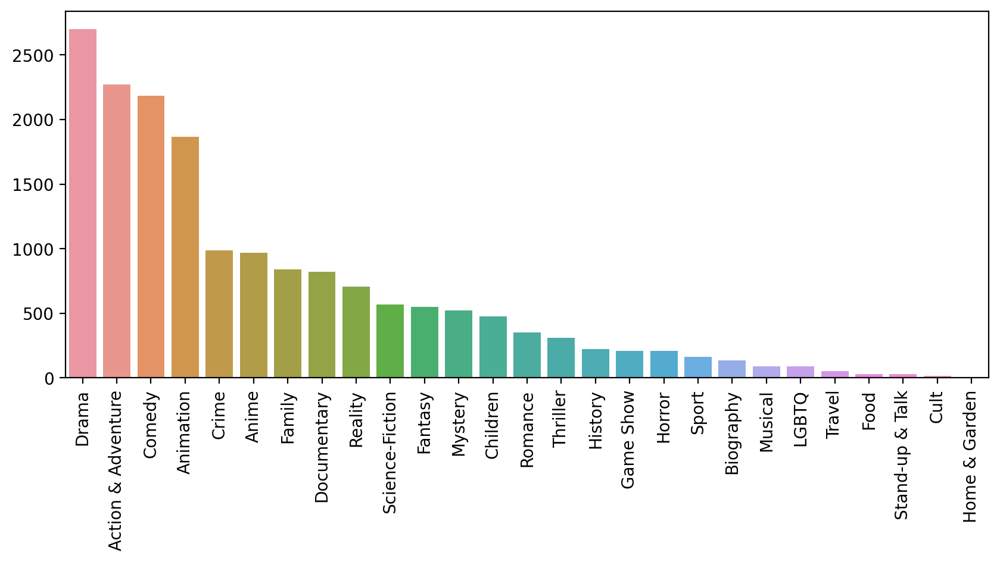

In [129]:
genre_counts = df['Genre'].value_counts().sort_values(ascending=False)
plt.figure(figsize=(10,4),dpi=200)
sns.barplot(x=genre_counts.index, y=genre_counts.values)
plt.xticks(rotation=90);

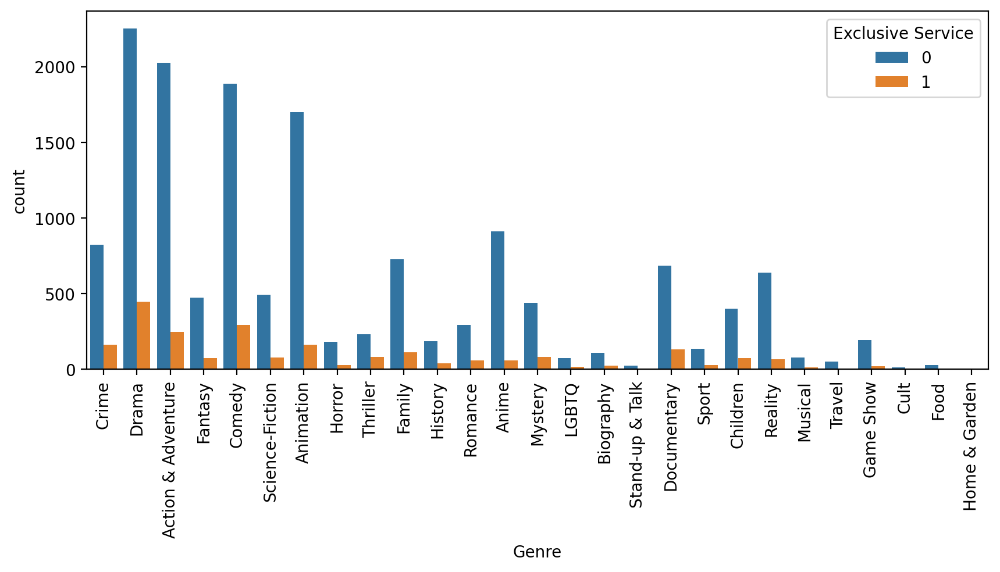

In [123]:
plt.figure(figsize=(10,4),dpi=200)
sns.countplot(data=df,x='Genre', hue='Exclusive Service')
plt.xticks(rotation=90);

In [151]:
imdb_reelgood_means = df.groupby('Genre').mean()[['IMDB', 'NormalizedReelGood']]

/var/folders/29/lh61825n1_v9yg4fhnvmrhmc0000gn/T/ipykernel_67841/3189557148.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  imdb_reelgood_means = df.groupby('Genre').mean()[['IMDB', 'NormalizedReelGood']]


In [152]:
print(imdb_reelgood_means)

                        IMDB  NormalizedReelGood
Genre                                           
Action & Adventure  7.261444            6.354754
Animation           7.224678            5.999195
Anime               7.450259            6.121717
Biography           7.824627            6.180597
Children            6.739241            5.783333
Comedy              7.190110            6.270559
Crime               7.542973            6.653084
Cult                7.285714            6.957143
Documentary         7.386203            5.449084
Drama               7.424333            6.647074
Family              6.781213            5.810820
Fantasy             7.183577            6.645073
Food                7.229032            5.009677
Game Show           6.709479            5.649763
History             7.723661            6.087946
Home & Garden       7.366667            5.166667
Horror              7.315789            6.694258
LGBTQ               7.525843            6.911236
Musical             

In [155]:
reelgood_means = df.groupby('Genre').mean()['NormalizedReelGood']

/var/folders/29/lh61825n1_v9yg4fhnvmrhmc0000gn/T/ipykernel_67841/1712612747.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  reelgood_means = df.groupby('Genre').mean()['NormalizedReelGood']


In [156]:
reelgood_means_sorted = reelgood_means.sort_values(ascending=False)
print(reelgood_means_sorted)

Genre
Cult                  6.957143
LGBTQ                 6.911236
Thriller              6.866559
Science-Fiction       6.737193
Horror                6.694258
Crime                 6.653084
Drama                 6.647074
Fantasy               6.645073
Mystery               6.576200
Romance               6.514571
Action & Adventure    6.354754
Comedy                6.270559
Biography             6.180597
Anime                 6.121717
History               6.087946
Musical               6.001111
Animation             5.999195
Sport                 5.893293
Stand-up & Talk       5.865517
Family                5.810820
Children              5.783333
Game Show             5.649763
Documentary           5.449084
Travel                5.366038
Reality               5.364681
Home & Garden         5.166667
Food                  5.009677
Name: NormalizedReelGood, dtype: float64


In [157]:
imdb_means = df.groupby('Genre').mean()['IMDB']

/var/folders/29/lh61825n1_v9yg4fhnvmrhmc0000gn/T/ipykernel_67841/1093188631.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  imdb_means = df.groupby('Genre').mean()['IMDB']


In [158]:
imdb_means_sorted = imdb_means.sort_values(ascending=False)
print(imdb_means_sorted)

Genre
Biography             7.824627
History               7.723661
Crime                 7.542973
LGBTQ                 7.525843
Thriller              7.497106
Anime                 7.450259
Sport                 7.431098
Drama                 7.424333
Documentary           7.386203
Stand-up & Talk       7.382759
Home & Garden         7.366667
Mystery               7.327831
Science-Fiction       7.322105
Horror                7.315789
Cult                  7.285714
Action & Adventure    7.261444
Travel                7.250943
Food                  7.229032
Animation             7.224678
Comedy                7.190110
Fantasy               7.183577
Musical               7.076667
Romance               7.054286
Family                6.781213
Children              6.739241
Game Show             6.709479
Reality               6.595035
Name: IMDB, dtype: float64


In [5]:
sharedata = pd.read_csv('Share Data 2016 to 2020.csv')

/var/folders/29/lh61825n1_v9yg4fhnvmrhmc0000gn/T/ipykernel_2207/3893988209.py:1: DtypeWarning:

Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.



In [7]:
sharedata.head()

,Unnamed: 0,Coverage Area,Market Break,Demographic,Broadcast Date,Originator,Program Name,Telecast Report Start Time,Summary Type Code,Playback Period,...,Rating Base,MC Weighted Viewing AA Minutes,MC DTVR,PESS,Avg Intab,Avg Scaled Intab,Avg Scaled Installed,UE (000),UE Type,File
0,0,Total US,Composite,Persons 2 - 99,2017-01-01,ABC,AMER FUNN HOME VIDEOS,19:00:00,COMEDY VARIETY,Live+7 Days (+168 Hours) | TV with Digital | L...,...,3.016700e+08,3.775582e+08,"C,M",65696,100197,36246,39699,301670,S,USC Marshall 2017 v2S.xlsx
1,1,Total US,Composite,Persons 2 - 99,2017-01-01,ABC,CONVICTION,22:00:00,GENERAL DRAMA,Live+7 Days (+168 Hours) | TV with Digital | L...,...,3.016700e+08,2.405016e+08,"C,M",65696,100197,36246,39699,301670,S,USC Marshall 2017 v2S.xlsx
2,2,Total US,Composite,Persons 2 - 99,2017-01-01,AMC,WALKING DEAD MARATHON,19:10:00,GENERAL DRAMA,Live+7 Days (+168 Hours) | TV with Digital | L...,...,3.016700e+08,4.448191e+07,"C,M",65696,100197,36246,39699,301670,S,USC Marshall 2017 v2S.xlsx
3,3,Total US,Composite,Persons 2 - 99,2017-01-01,AMC,WALKING DEAD MARATHON,20:10:00,GENERAL DRAMA,Live+7 Days (+168 Hours) | TV with Digital | L...,...,3.016700e+08,6.965312e+07,"C,M",65696,100197,36246,39699,301670,S,USC Marshall 2017 v2S.xlsx
4,4,Total US,Composite,Persons 2 - 99,2017-01-01,AMC,WALKING DEAD MARATHON,21:35:00,GENERAL DRAMA,Live+7 Days (+168 Hours) | TV with Digital | L...,...,3.016700e+08,4.549348e+07,"C,M",65696,100197,36246,39699,301670,S,USC Marshall 2017 v2S.xlsx


In [8]:
sharedata['Coverage Area'].unique()

array(['Total US'], dtype=object)